All import need to test OCR ID

In [20]:
from edenai_apis.loaders.data_loader import ProviderDataEnum
from edenai_apis.loaders.loaders import load_provider
import base64
import requests
import json
import os
from pprint import pprint

Load settings of all providers

In [13]:
mindee_settings = load_provider(ProviderDataEnum.KEY, provider_name='mindee')
google_settings, google_location = load_provider(ProviderDataEnum.KEY, provider_name='google', location=True)
aws_settings = load_provider(ProviderDataEnum.KEY, provider_name='amazon')
base64_settings = load_provider(ProviderDataEnum.KEY, provider_name='base64')
microsoft_settings = load_provider(ProviderDataEnum.KEY, 'microsoft')

Test with Mindee

In [4]:
file = open('../data/passport-GB.jpg', 'rb')

files = {
    "document": file
}

headers = {
    "Authorization": f"Token {mindee_settings['ocr_id']['subscription_key']}"
}

response = requests.post(url=mindee_settings['ocr_id']['url'], files=files, headers=headers)

response.json()

{'api_request': {'error': {},
  'resources': ['document'],
  'status': 'success',
  'status_code': 201,
  'url': 'https://api.mindee.net/v1/products/mindee/passport/v1/predict'},
 'document': {'id': '6de49344-67a0-43ad-8526-8790bf1c7a80',
  'inference': {'extras': {},
   'finished_at': '2022-11-16T11:23:47+00:00',
   'is_rotation_applied': True,
   'pages': [{'extras': {},
     'id': 0,
     'orientation': {'value': 0},
     'prediction': {'birth_date': {'confidence': 0.99,
       'polygon': [[0.395, 0.645],
        [0.558, 0.645],
        [0.558, 0.664],
        [0.395, 0.664]],
       'value': '1960-04-25'},
      'birth_place': {'confidence': 0.92,
       'polygon': [[0.47, 0.67], [0.548, 0.67], [0.548, 0.684], [0.47, 0.684]],
       'value': 'LONDON'},
      'country': {'confidence': 0.99,
       'polygon': [[0.517, 0.559],
        [0.553, 0.559],
        [0.553, 0.572],
        [0.517, 0.572]],
       'value': 'GBR'},
      'expiry_date': {'confidence': 0.99,
       'polygon': [[0

Test with base64

[{'features': {'creditsSpent': 1,
               'faces': [{'bottom': 469,
                          'bottomLeft': {'x': 817, 'y': 469},
                          'bottomRight': {'x': 944, 'y': 469},
                          'confidence': 0.9,
                          'height': 159,
                          'image': '',
                          'left': 817,
                          'pageNumber': 0,
                          'right': 944,
                          'top': 310,
                          'topLeft': {'x': 817, 'y': 310},
                          'topRight': {'x': 944, 'y': 310},
                          'width': 127}],
               'properties': {'height': 1390,
                              'isGlareFree': True,
                              'isInFocus': True,
                              'mimeType': 'image/png',
                              'pageCount': 1,
                              'rotationAngle': 0,
                              'width': 1272},
           
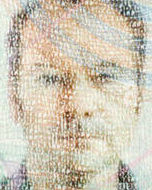
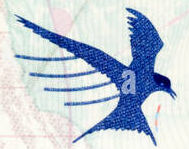

In [22]:
file = open('../data/passport-GB.jpg', 'rb')

image_b64 = base64.b64encode(file.read()).decode('utf-8')

payload = json.dumps({
    "image": f"data:image/png;base64,{image_b64}"
})

headers = {
    'Content-Type': 'application/json',
    'Authorization': base64_settings['secret']
}

response = requests.post(url=base64_settings['endpoint'], headers=headers, data=payload)

pprint(response.json())

Test with amazon

In [21]:
from edenai_apis.apis.amazon.config import clients, audio_voices_ids, tags, storage_clients, api_settings

filename = '../data/passport-GB.jpg'
file = open(f'./{filename}', 'rb')

response = clients.get('textract').analyze_id(DocumentPages=[{
    "Bytes": file.read(),
    "S3Object": { 'Bucket': aws_settings['bucket'], 'Name': filename}
    }])

pprint(response)

{'AnalyzeIDModelVersion': '1.0',
 'DocumentMetadata': {'Pages': 1},
 'IdentityDocuments': [{'Blocks': [{'BlockType': 'PAGE',
                                    'Geometry': {'BoundingBox': {'Height': 0.7899317145347595,
                                                                 'Left': 0.1318148821592331,
                                                                 'Top': 0.07119069993495941,
                                                                 'Width': 0.7526946067810059},
                                                 'Polygon': [{'X': 0.13322660326957703,
                                                              'Y': 0.07339528203010559},
                                                             {'X': 0.8737339377403259,
                                                              'Y': 0.07119069993495941},
                                                             {'X': 0.8845095038414001,
                                                           

Test with microsoft

In [23]:
file = open('../data/passport-GB.jpg', 'rb')
file_content = file.read()

headers = {
    "Ocp-Apim-Subscription-Key": microsoft_settings["ocr_id"]["subscription_key"],
    "Content-Type": "application/octet-stream",
}

response = requests.post(
    url=f"{microsoft_settings['ocr_id']['url']}:analyze?{microsoft_settings['ocr_id']['api_version']}",
    headers=headers,
    data=file_content
)

request_id = response.headers['apim-request-id']

response = requests.get(
    url=f"{microsoft_settings['ocr_id']['url']}/analyzeResults/{request_id}?{microsoft_settings['ocr_id']['api_version']}",
    headers=headers,
)

while response.json()['status'] == 'running':
    response = requests.get(
    url=f"{microsoft_settings['ocr_id']['url']}/analyzeResults/{request_id}?{microsoft_settings['ocr_id']['api_version']}",
    headers=headers,
    )

from pprint import pprint

pprint(response.json())

{'analyzeResult': {'apiVersion': '2022-08-31',
                   'content': 'THIS PAGE IS RESERVED FOR OFFICIAL OBSERVATIONS '
                              'CETTE PAGE EST RESERVEE AUX OBSERVATIONS '
                              'OFFICIELLES (11)\n'
                              'B\n'
                              '$THERE ARE NO OFFICIAL OBSERVATIONS*\n'
                              '1998060888\n'
                              'UNITED KINGDOM OF GREAT BRITAIN AND NORTHERN '
                              'IRELAND\n'
                              'PASSPORT PASSEPORT\n'
                              'a\n'
                              'Type/Type P\n'
                              'Code/Code\n'
                              'GBR\n'
                              'Sumame/Nom (1) SMITH Given names/Prénoms (2) '
                              'JOHN JAMES\n'
                              'Nationality/Nationalité (3) BRITISH CITIZEN '
                              'Date of birth/Date de naiss

Test with google

In [16]:
import os
from google.cloud import documentai
from google.api_core.client_options import ClientOptions

os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = google_location

filename = 'passport-US.pdf'
file = open(f'../data/{filename}', 'rb')
file_content = file.read()

client = documentai.DocumentProcessorServiceClient(client_options={"api_endpoint": "eu-documentai.googleapis.com"})

image = documentai.Document(content=file_content, mime_type='application/pdf')

name =client.processor_path(project=google_settings['documentai']['project_id'], location='eu', processor=google_settings['documentai']['ocr_id']['process_id'])

request = documentai.ProcessRequest(name=name, inline_document=image)

response = client.process_document(request=request)

response.document

text: "PASSPORT\nPASSEPORT/PASAPORTE\nTHE UNITED STATES OF AMERICA\nType/Type/Tipo\nPassport No./No. du Passeport/No.de Pasaporte\nCode Code/C\303\263digo\nUSA\nP\nE00007730\nUSA\nSurname/Nom/Apellidos\nTRAVELER\nGiven names/Pr\303\251noms/Nombres\nHAPPY\nNationality/Nationalit\303\251/Nacionalidad\nUNITED STATES OF AMERICA\nDate of birth/Date de naissande/hecha de\n05 FEB 1965\nSex/Sexe/Sexo\nECIMEN\ncimento\nSP\nPlace of birth ou de naissance/Lugar de nacimiento\nWASHINGTON, D.C., U.S.A.\nDate of issue/Date de d\303\251livrance/Fecha de expedici\303\263n\n15 OCT 2020\nDate of expiration/Date d\'expiration/Fecha de caducidad\n14 OCT 2030\nAuthority/Autorit\303\251/Autoridad\nUNITED STATES DEPARTMENT OF STATE\n05.02 65\nP<USATRAVELER<<HAPPY<<<<<<<<<<<<<<<<<<<<<<<<\nE000077303 USA6502056F3010149500101920<091824\n"
pages {
  page_number: 1
  dimension {
    width: 2275.0
    height: 1759.0
    unit: "pixels"
  }
  layout {
    text_anchor {
      text_segments {
        end_index: 740
  